In [1]:
import requests

def get_weather(city):
    api_key = "YOUR_API_KEY"  # Replace with your actual API key
    url = f"https://api.openweathermap.org/data/2.5/weather?q={city}&appid={api_key}&units=metric"

    response = requests.get(url)
    if response.status_code == 200:
        data = response.json()
        return data
    else:
        return None

def display_weather(data):
    if data:
        print(f"City: {data['name']}")
        print(f"Temperature: {data['main']['temp']}°C")
        print(f"Humidity: {data['main']['humidity']}%")
        print(f"Weather: {data['weather'][0]['description']}")
        print(f"Wind Speed: {data['wind']['speed']} m/s")
    else:
        print("City not found.")
        if __name__ == "__main__":
            city = input("Enter city name: ")
            weather_data = get_weather(city)
            display_weather(weather_data)

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

In [3]:
weather = pd.read_csv('/content/weather.csv')
weather.head()

,Data.Precipitation,Date.Full,Date.Month,Date.Week of,Date.Year,Station.City,Station.Code,Station.Location,Station.State,Data.Temperature.Avg Temp,Data.Temperature.Max Temp,Data.Temperature.Min Temp,Data.Wind.Direction,Data.Wind.Speed
0,0.00,2016-01-03,1,3,2016,Birmingham,BHM,"Birmingham, AL",Alabama,39,46,32,33,4.33
1,0.00,2016-01-03,1,3,2016,Huntsville,HSV,"Huntsville, AL",Alabama,39,47,31,32,3.86
2,0.16,2016-01-03,1,3,2016,Mobile,MOB,"Mobile, AL",Alabama,46,51,41,35,9.73
3,0.00,2016-01-03,1,3,2016,Montgomery,MGM,"Montgomery, AL",Alabama,45,52,38,32,6.86
4,0.01,2016-01-03,1,3,2016,Anchorage,ANC,"Anchorage, AK",Alaska,34,38,29,19,7.80


Data Inspection:

In [4]:
weather.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16743 entries, 0 to 16742
Data columns (total 14 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Data.Precipitation         16743 non-null  float64
 1   Date.Full                  16743 non-null  object 
 2   Date.Month                 16743 non-null  int64  
 3   Date.Week of               16743 non-null  int64  
 4   Date.Year                  16743 non-null  int64  
 5   Station.City               16743 non-null  object 
 6   Station.Code               16743 non-null  object 
 7   Station.Location           16743 non-null  object 
 8   Station.State              16743 non-null  object 
 9   Data.Temperature.Avg Temp  16743 non-null  int64  
 10  Data.Temperature.Max Temp  16743 non-null  int64  
 11  Data.Temperature.Min Temp  16743 non-null  int64  
 12  Data.Wind.Direction        16743 non-null  int64  
 13  Data.Wind.Speed            16743 non-null  flo

In [5]:
weather.shape

(16743, 14)

In [6]:
weather.describe().T

,count,mean,std,min,25%,50%,75%,max
Data.Precipitation,16743.0,0.579090,0.988057,0.0,0.00,0.19,0.75,20.89
Date.Month,16743.0,6.343128,3.490723,1.0,3.00,6.00,9.00,12.00
Date.Week of,16743.0,15.650242,8.923425,1.0,8.00,16.00,24.00,31.00
Date.Year,16743.0,2016.018933,0.136294,2016.0,2016.00,2016.00,2016.00,2017.00
Data.Temperature.Avg Temp,16743.0,56.089112,18.798295,-27.0,44.00,58.00,71.00,100.00
Data.Temperature.Max Temp,16743.0,66.042406,19.787954,-19.0,53.00,68.00,82.00,111.00
Data.Temperature.Min Temp,16743.0,45.642716,18.559263,-35.0,33.00,47.00,60.00,88.00
Data.Wind.Direction,16743.0,18.791316,6.461527,0.0,15.00,19.00,23.00,36.00
Data.Wind.Speed,16743.0,6.329820,3.494785,0.0,4.04,5.94,8.08,61.10


In [7]:
weather.nunique()

,0
Data.Precipitation,565
Date.Full,53
Date.Month,12
Date.Week of,31
Date.Year,2
Station.City,307
Station.Code,318
Station.Location,318
Station.State,53
Data.Temperature.Avg Temp,119


In [8]:
weather.isnull().sum()

,0
Data.Precipitation,0
Date.Full,0
Date.Month,0
Date.Week of,0
Date.Year,0
Station.City,0
Station.Code,0
Station.Location,0
Station.State,0
Data.Temperature.Avg Temp,0


There are no missing values so the analysis will be smooth.

In [9]:
weather.duplicated().sum()

0

In [10]:
weather.iloc[:5]

,Data.Precipitation,Date.Full,Date.Month,Date.Week of,Date.Year,Station.City,Station.Code,Station.Location,Station.State,Data.Temperature.Avg Temp,Data.Temperature.Max Temp,Data.Temperature.Min Temp,Data.Wind.Direction,Data.Wind.Speed
0,0.00,2016-01-03,1,3,2016,Birmingham,BHM,"Birmingham, AL",Alabama,39,46,32,33,4.33
1,0.00,2016-01-03,1,3,2016,Huntsville,HSV,"Huntsville, AL",Alabama,39,47,31,32,3.86
2,0.16,2016-01-03,1,3,2016,Mobile,MOB,"Mobile, AL",Alabama,46,51,41,35,9.73
3,0.00,2016-01-03,1,3,2016,Montgomery,MGM,"Montgomery, AL",Alabama,45,52,38,32,6.86
4,0.01,2016-01-03,1,3,2016,Anchorage,ANC,"Anchorage, AK",Alaska,34,38,29,19,7.80


In [11]:
weather.loc[:5]

,Data.Precipitation,Date.Full,Date.Month,Date.Week of,Date.Year,Station.City,Station.Code,Station.Location,Station.State,Data.Temperature.Avg Temp,Data.Temperature.Max Temp,Data.Temperature.Min Temp,Data.Wind.Direction,Data.Wind.Speed
0,0.00,2016-01-03,1,3,2016,Birmingham,BHM,"Birmingham, AL",Alabama,39,46,32,33,4.33
1,0.00,2016-01-03,1,3,2016,Huntsville,HSV,"Huntsville, AL",Alabama,39,47,31,32,3.86
2,0.16,2016-01-03,1,3,2016,Mobile,MOB,"Mobile, AL",Alabama,46,51,41,35,9.73
3,0.00,2016-01-03,1,3,2016,Montgomery,MGM,"Montgomery, AL",Alabama,45,52,38,32,6.86
4,0.01,2016-01-03,1,3,2016,Anchorage,ANC,"Anchorage, AK",Alaska,34,38,29,19,7.80
5,0.09,2016-01-03,1,3,2016,Annette,ANN,"Annette, AK",Alaska,38,44,31,9,8.70


In [12]:
weather['Station.Location']

,Station.Location
0,"Birmingham, AL"
1,"Huntsville, AL"
2,"Mobile, AL"
3,"Montgomery, AL"
4,"Anchorage, AK"
...,...
16738,"Casper, WY"
16739,"Cheyenne, WY"
16740,"Lander, WY"
16741,"Rawlins, WY"


Data Visualization:

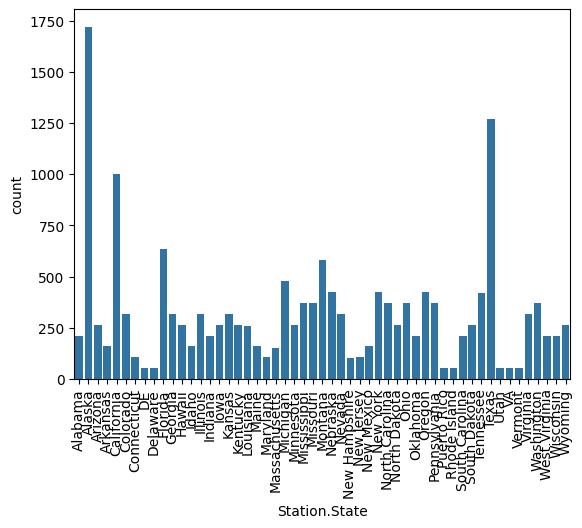

In [13]:
sns.countplot(data=weather, x='Station.State')
plt.xticks(rotation=90)
plt.show()

In [14]:
weather = {col: weather[col].value_counts() for col in weather.columns}
weather

{'Data.Precipitation': Data.Precipitation
 0.00    4324
 0.01     549
 0.02     366
 0.03     333
 0.04     279
         ... 
 4.63       1
 4.94       1
 5.22       1
 4.48       1
 3.66       1
 Name: count, Length: 565, dtype: int64,
 'Date.Full': Date.Full
 2017-01-01    317
 2016-10-02    317
 2016-08-21    317
 2016-08-28    317
 2016-09-04    317
 2016-06-05    317
 2016-05-29    317
 2016-05-22    317
 2016-05-15    317
 2016-05-08    317
 2016-05-01    317
 2016-08-07    317
 2016-04-03    317
 2016-10-09    317
 2016-10-16    317
 2016-03-06    317
 2016-10-23    317
 2016-10-30    317
 2016-11-06    317
 2016-12-04    317
 2016-12-11    317
 2016-12-18    317
 2016-12-25    317
 2016-08-14    317
 2016-09-25    316
 2016-09-18    316
 2016-09-11    316
 2016-07-03    316
 2016-04-24    316
 2016-04-17    316
 2016-04-10    316
 2016-03-20    315
 2016-03-13    315
 2016-01-17    315
 2016-01-24    315
 2016-01-31    315
 2016-02-07    315
 2016-02-14    315
 2016-02-21    31

In [15]:
weather['Date.Full'] = pd.DataFrame(weather['Date.Full'])
weather['Date.Full']

,count
Date.Full,
2017-01-01,317
2016-10-02,317
2016-08-21,317
2016-08-28,317
2016-09-04,317
2016-06-05,317
2016-05-29,317
2016-05-22,317
2016-05-15,317


In [16]:
weather_df = pd.DataFrame(list(weather['Data.Precipitation'].items()), columns=['Data.Precipitation', 'Count']) # Create dataframe from the dictionary

plt.figure(figsize=(200, 500))
# Use barplot instead of bar
# Choose 'Data.Precipitation' for the x-axis and 'Count' for the y-axis
sns.barplot(data=weather_df, x='Data.Precipitation', y='Count')
plt.xticks(rotation=90) # Rotate x-axis labels for readability
plt.show()

Temperature as per State:

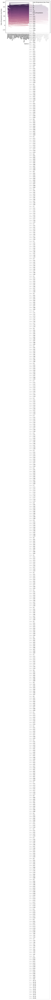

In [17]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

# Load the original weather data (assuming it's in a CSV file)
weather = pd.read_csv('/content/weather.csv')

plt.figure(figsize=(7, 5))
plt.xticks(rotation=90)

# Replace 'Precip Type' with the actual column name for precipitation type in your DataFrame
# For example, if the column is named 'Data.Precipitation', use that instead.
sns.lineplot(
    data=weather,
    x="Station.State",
    y="Data.Temperature.Avg Temp",
    hue="Data.Temperature.Max Temp",
    style="Data.Precipitation",  # Corrected column name
)

plt.show()

In [18]:
location = weather['Station.Location']

In [19]:
location.unique()

array(['Birmingham, AL', 'Huntsville, AL', 'Mobile, AL', 'Montgomery, AL',
       'Anchorage, AK', 'Annette, AK', 'Bethel, AK', 'Bettles, AK',
       'Cold Bay, AK', 'Cordova, AK', 'Delta Junction/Ft Greely, AK',
       'Fairbanks, AK', 'Gulkana, AK', 'Homer, AK', 'Iliamna, AK',
       'Juneau, AK', 'Kenai, AK', 'Ketchikan, AK', 'King Salmon, AK',
       'Kodiak, AK', 'Kotzebue, AK', 'Mc Grath, AK', 'Nome, AK',
       'Northway, AK', 'Palmer, AK', 'Petersburg, AK',
       'Puntilla Lake, AK', 'Shemya, AK', 'Sitka, AK', 'Skagway, AK',
       'St Paul Island, AK', 'Talkeetna, AK', 'Tanana, AK',
       'Utqiagvik (Barrow), AK', 'Yakutat, AK', 'Douglas Bisbee, AZ',
       'Kingman, AZ', 'Phoenix, AZ', 'Tucson, AZ', 'Winslow, AZ',
       'Fort Smith, AR', 'Harrison, AR', 'North Little Rock, AR',
       'Bakersfield, CA', 'Bishop, CA', 'China Lake, CA', 'Concord, CA',
       'Eureka, CA', 'Fresno, CA', 'Hayward, CA', 'Long Beach, CA',
       'Los Angeles, CA', 'Red Bluff, CA', 'Redding, CA',

In [20]:
def region_analyser(region):
    data=weather[weather['Station.Location']==region]
    data=data.sort_values('Date.Full')
    data=data.reset_index()
    data=data.drop('index',axis=1)
    data=data.drop('Station.Location',axis=1)
    data=data.set_index('Date.Full')
    return data

In [21]:
region_analyser('Alaska')

,Data.Precipitation,Date.Month,Date.Week of,Date.Year,Station.City,Station.Code,Station.State,Data.Temperature.Avg Temp,Data.Temperature.Max Temp,Data.Temperature.Min Temp,Data.Wind.Direction,Data.Wind.Speed
Date.Full,,,,,,,,,,,,


In [22]:
region_analyser('California')

,Data.Precipitation,Date.Month,Date.Week of,Date.Year,Station.City,Station.Code,Station.State,Data.Temperature.Avg Temp,Data.Temperature.Max Temp,Data.Temperature.Min Temp,Data.Wind.Direction,Data.Wind.Speed
Date.Full,,,,,,,,,,,,


In [23]:
def feature_analyzer(region,feature,rows):
    data=region_analyser(region)

    plt.subplot(2,1,1)
    data[feature].head(rows).plot()
    plt.axhline(data[feature].mean(),color='k',linestyle='--',linewidth=2.5)
    plt.axhline(data[feature].median(),color='g',linestyle='--',linewidth=2.5)

    # Check if mode is empty before accessing element
    mode_values = data[feature].mode()
    if not mode_values.empty:
        plt.axhline(mode_values[0], color='m', linestyle='--', linewidth=3)

    plt.legend()
    plt.grid()

    plt.subplot(2,1,2)
    sns.kdeplot(data[feature].head(rows))
    plt.axvline(data[feature].mean(),color='k',linestyle='--',linewidth=2.5)
    plt.axvline(data[feature].median(),color='g',linestyle='--',linewidth=2.5)

    # Check if mode is empty before accessing element
    if not mode_values.empty:
        plt.axvline(mode_values[0], color='m', linestyle='--', linewidth=3)

    plt.legend()
    plt.grid()

    plt.tight_layout()
    plt.show()

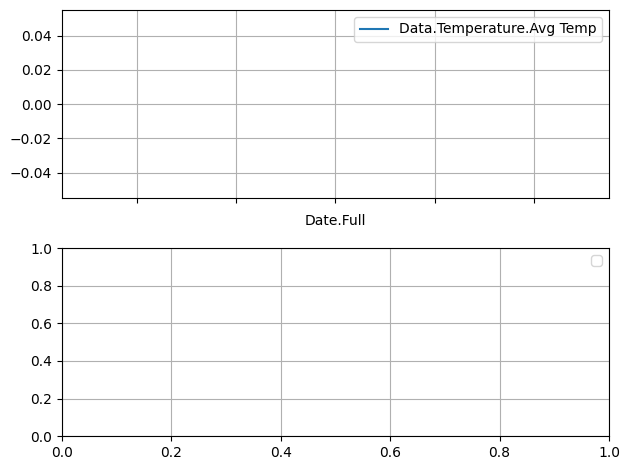

In [24]:
feature_analyzer('Alaska','Data.Temperature.Avg Temp',150)

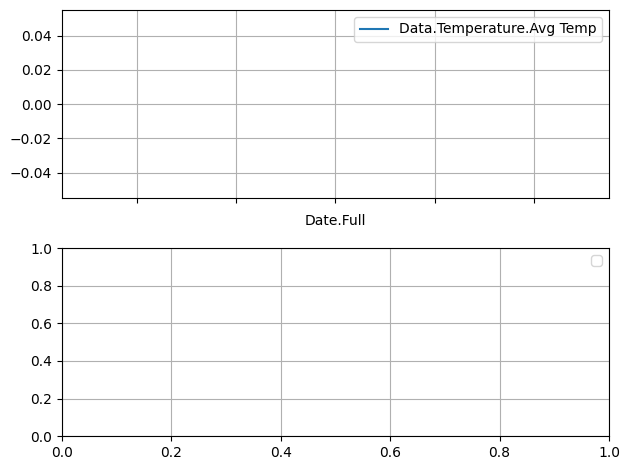

In [25]:
feature_analyzer('California','Data.Temperature.Avg Temp', 200)

Weather Data For each month:

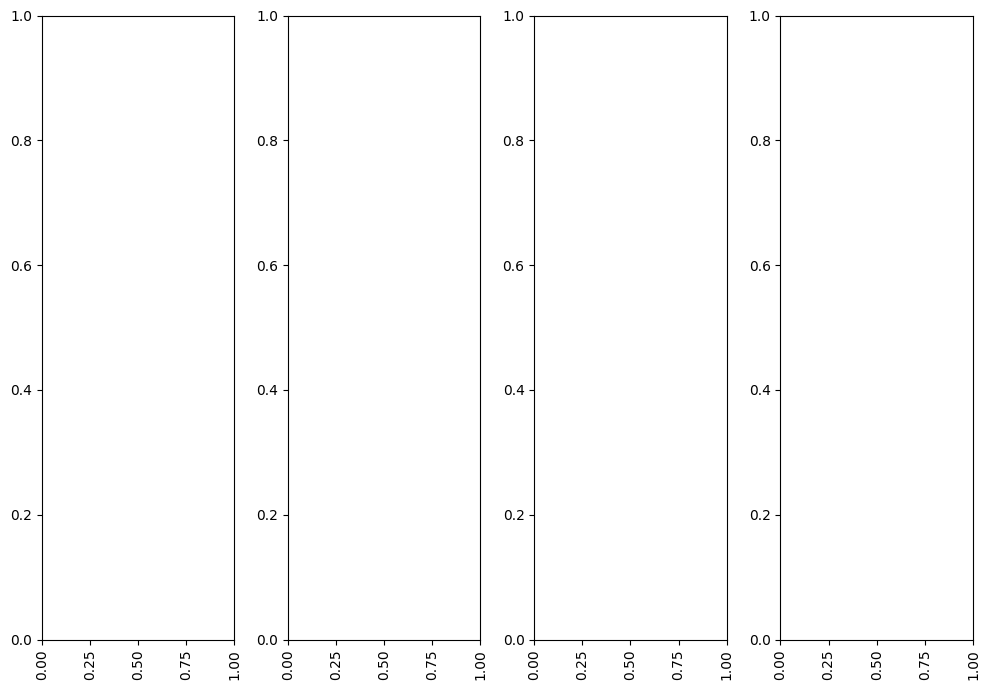

In [26]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(10, 7))

# Assuming 'nums' should be a list of column names for plotting
# Replace this with the actual columns you want to plot
nums = ["Data.Temperature.Avg Temp", "Data.Temperature.Max Temp", "Data.Temperature.Min Temp", "Data.Wind.Direction"]

for i, j in enumerate(nums):
    # Replace 'plots' with the appropriate plotting function, e.g., sns.barplot, sns.lineplot
    # Example using sns.barplot:
    # sns.barplot(x="Date.Month", y=j, data=weather, ax=axes[i])
    # You'll need to adjust this based on the type of plot you want
    # and the structure of your data

    # This is a placeholder. Replace with the correct plotting function and parameters.
    # For example, if you want a bar plot, you could use:
    # sns.barplot(x='Date.Month', y=j, data=weather, ax=axes[i])
    # Make sure to replace 'x' and 'y' with the correct column names.
    # Add other parameters like 'hue', 'style', etc. as needed.

    axes[i].set_xticklabels(axes[i].get_xticklabels(), rotation=90)

    # Similarly, replace 'bar_label' with the actual function if it's defined elsewhere
    # or comment it out if it's not needed.
    # bar_label(axes[i])

    axes[i].set_ylabel("")
    axes[i].set_xlabel(' '.join(j.split('_')[:-1]))

plt.tight_layout()
plt.show()

Mean numerical Data:

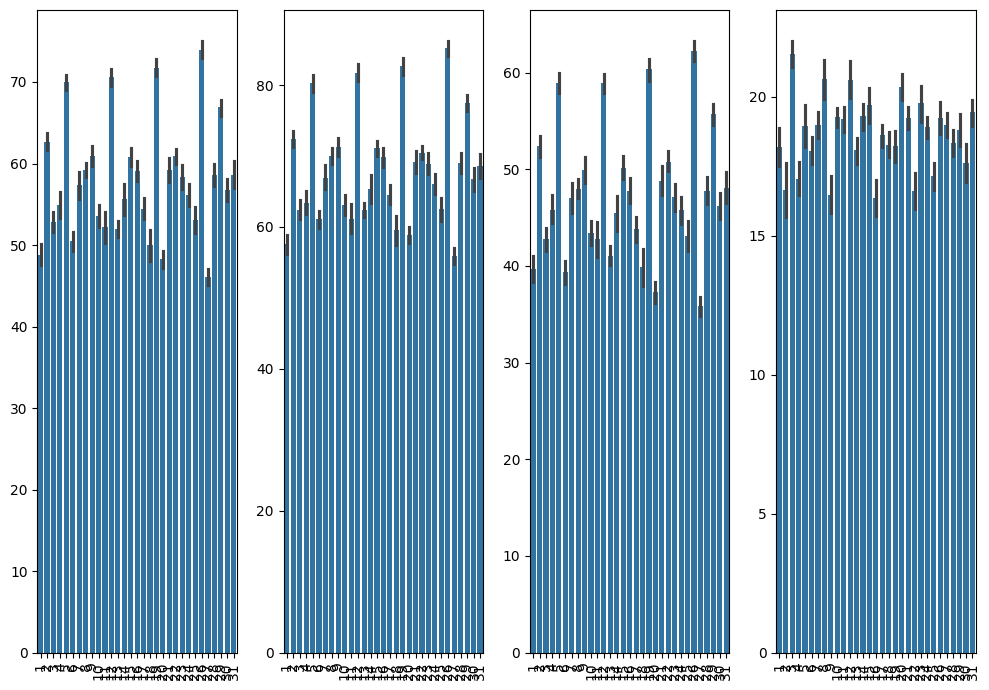

In [27]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(10, 7))

for i, j in enumerate(nums):
    # Replace 'plots' with the appropriate plotting function and parameters.
    # Here's an example using sns.barplot:
    sns.barplot(x="Date.Week of", y=j, data=weather, ax=axes[i])
    # You'll need to adjust this based on the type of plot you want
    # and the structure of your data

    axes[i].set_xticklabels(axes[i].get_xticklabels(), rotation=90)
    # bar_label(axes[i])  # Uncomment if bar_label is defined
    axes[i].set_ylabel("")
    axes[i].set_xlabel(' '.join(j.split('_')[:-1]))

plt.tight_layout()
plt.show()

Distribution of data over week and daily basis for first 5 months:

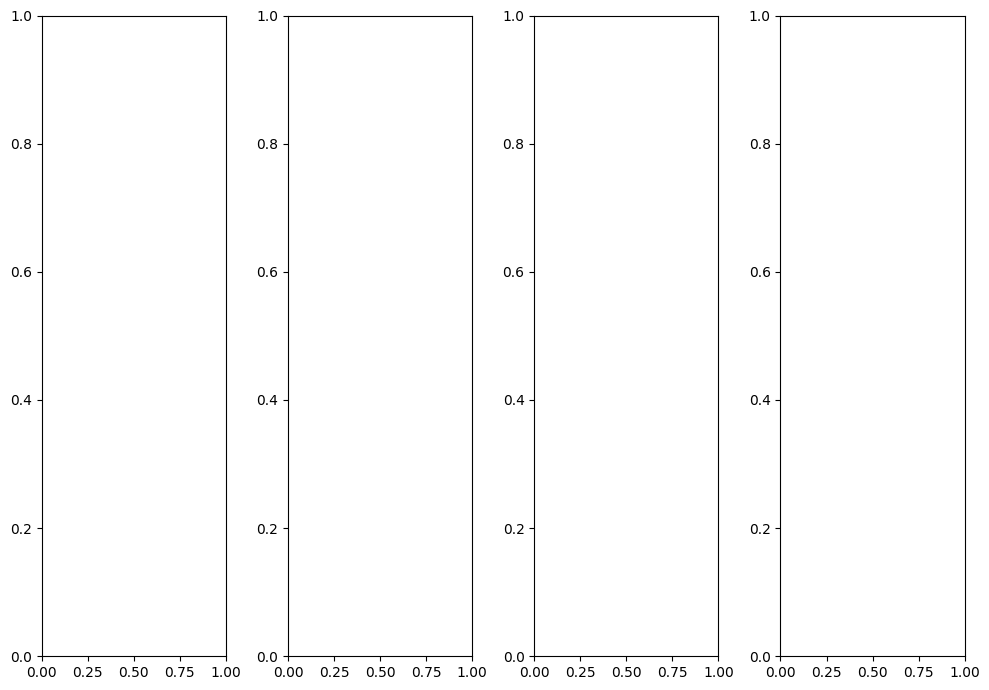

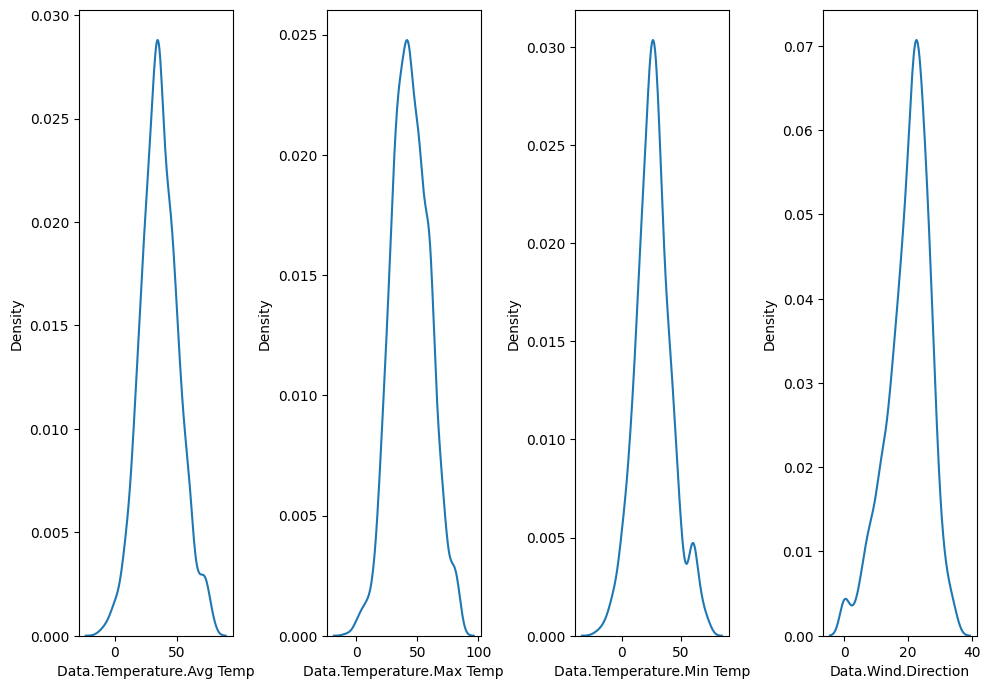

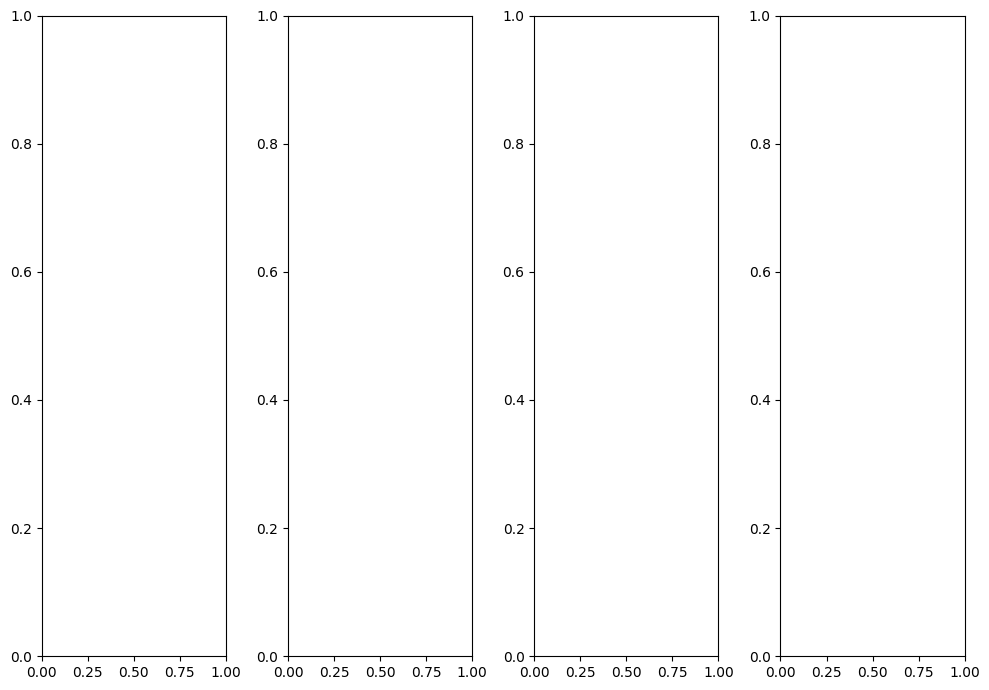

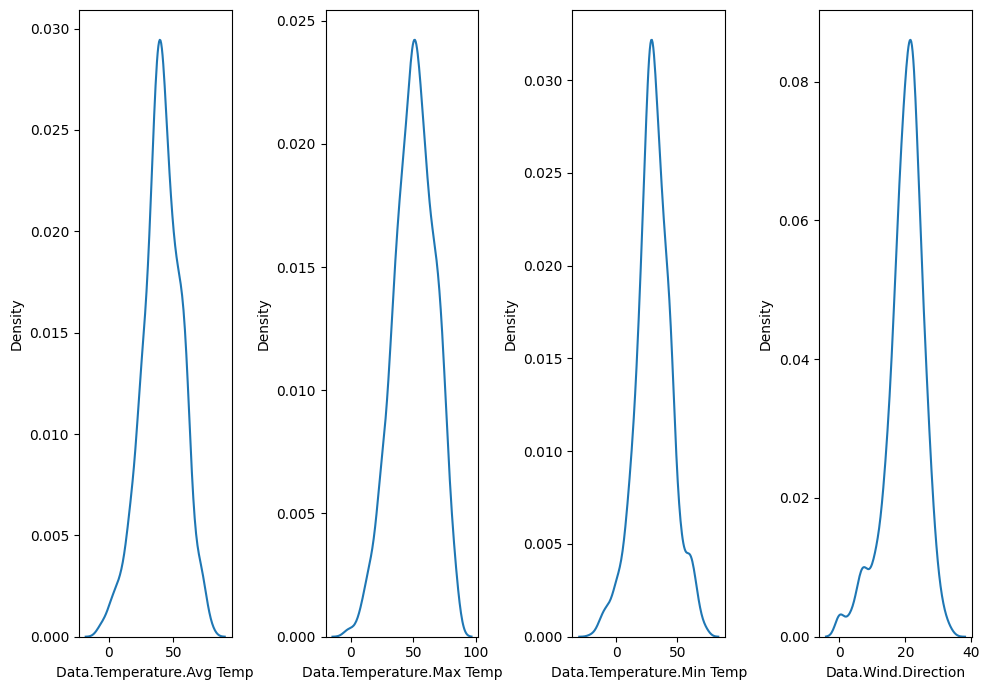

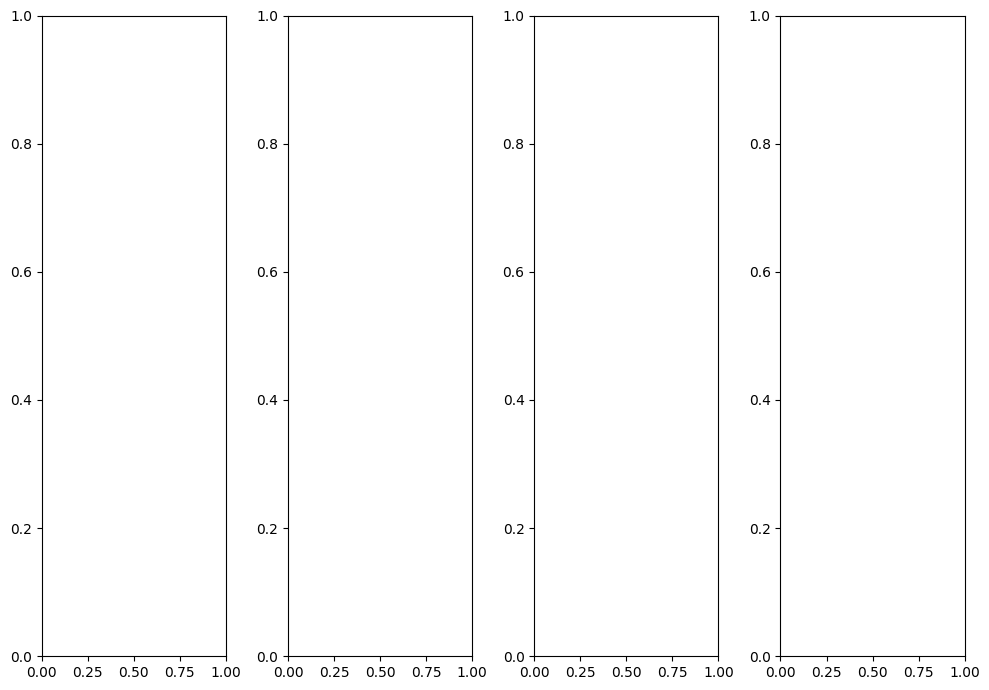

...

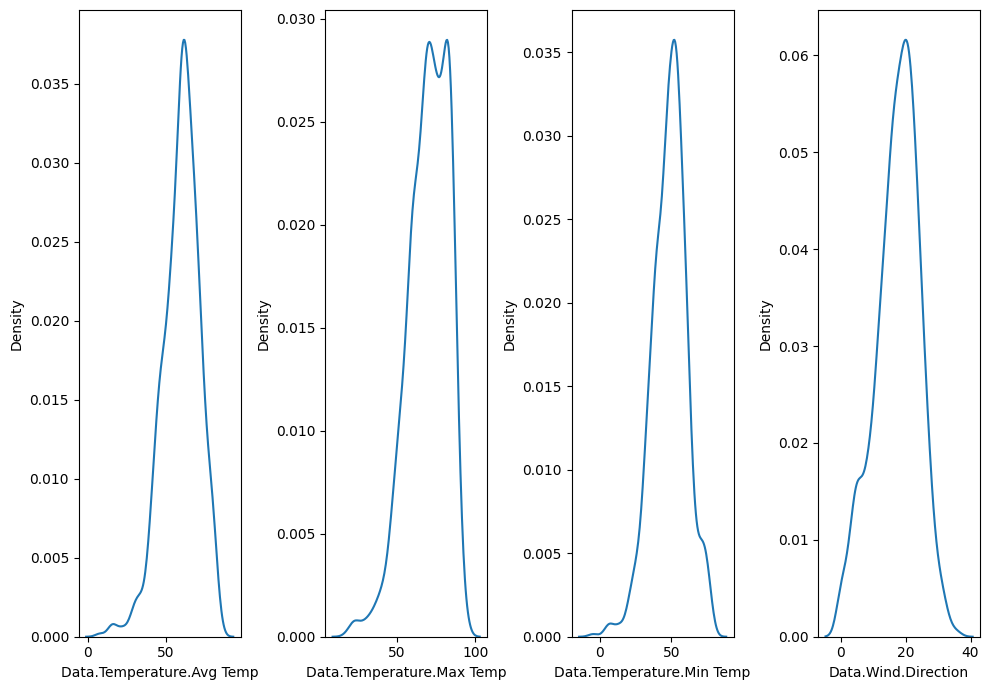

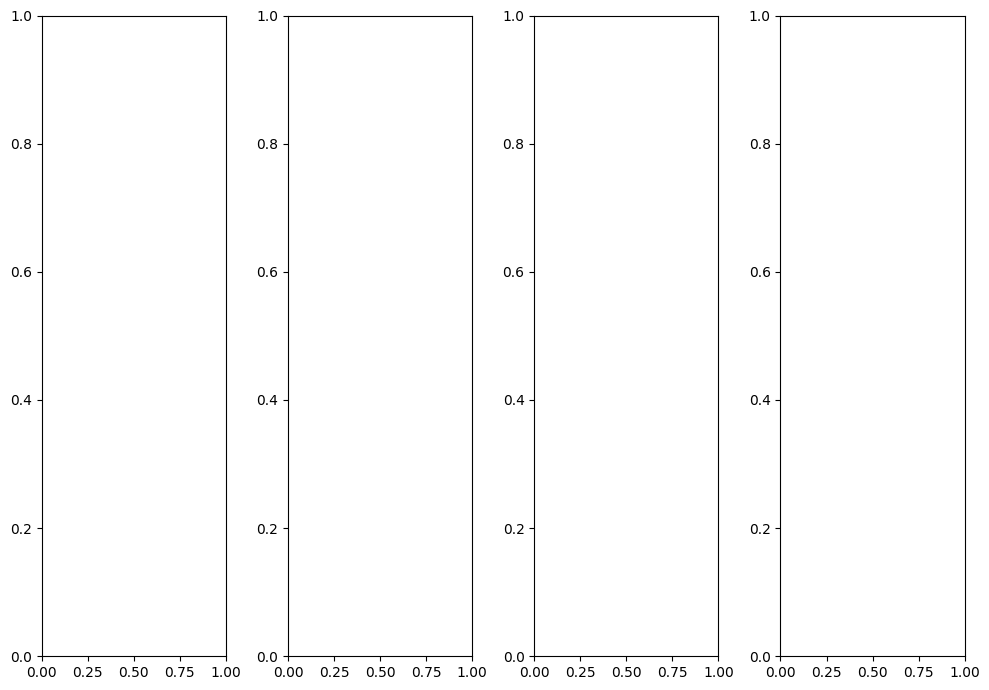

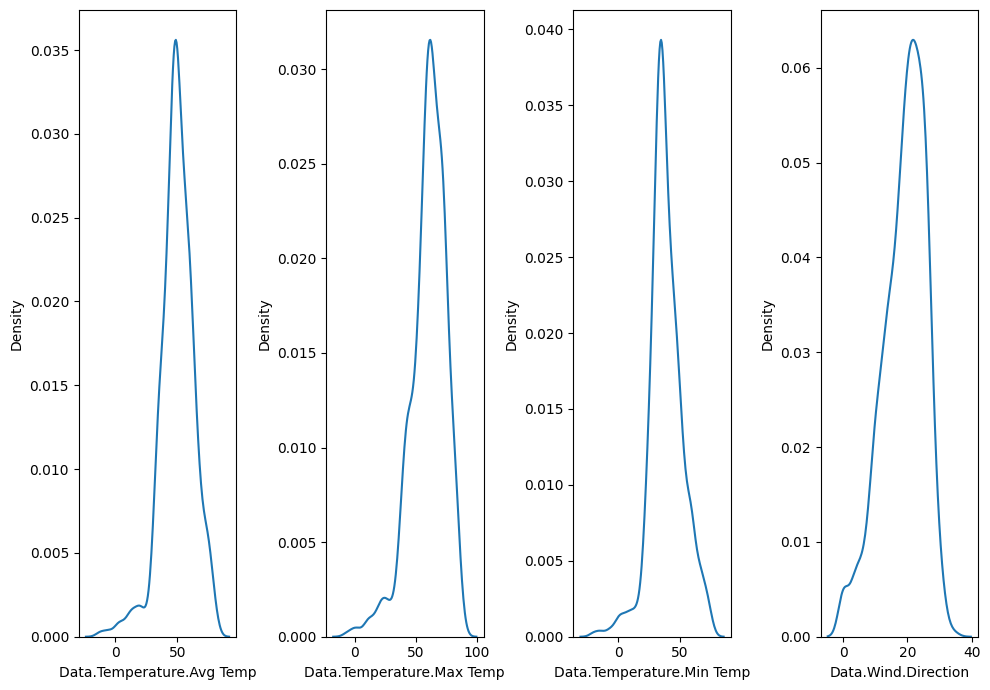

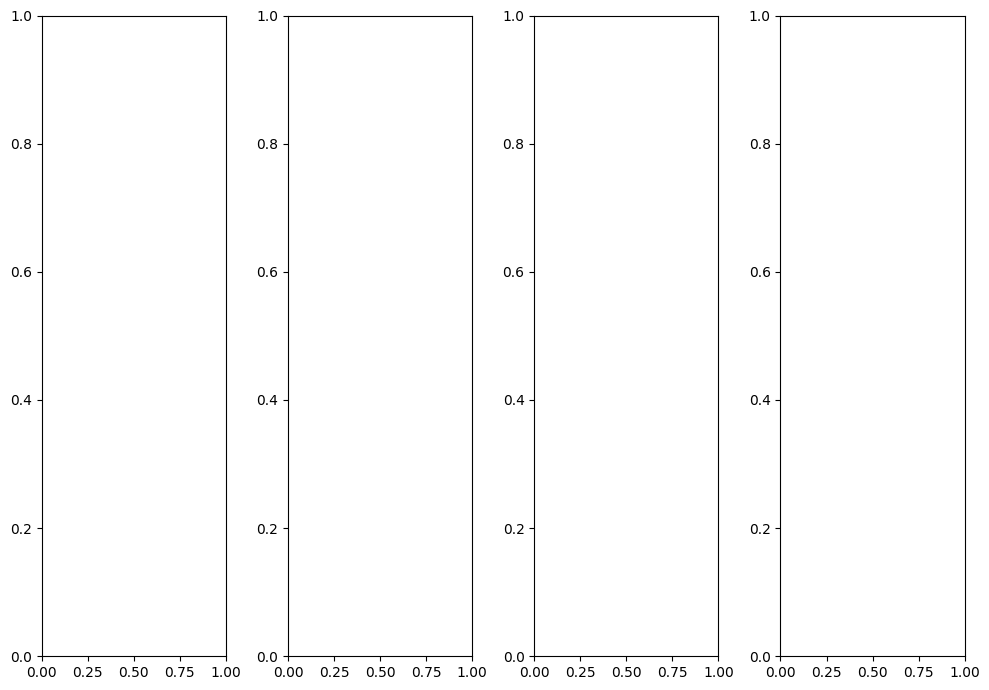

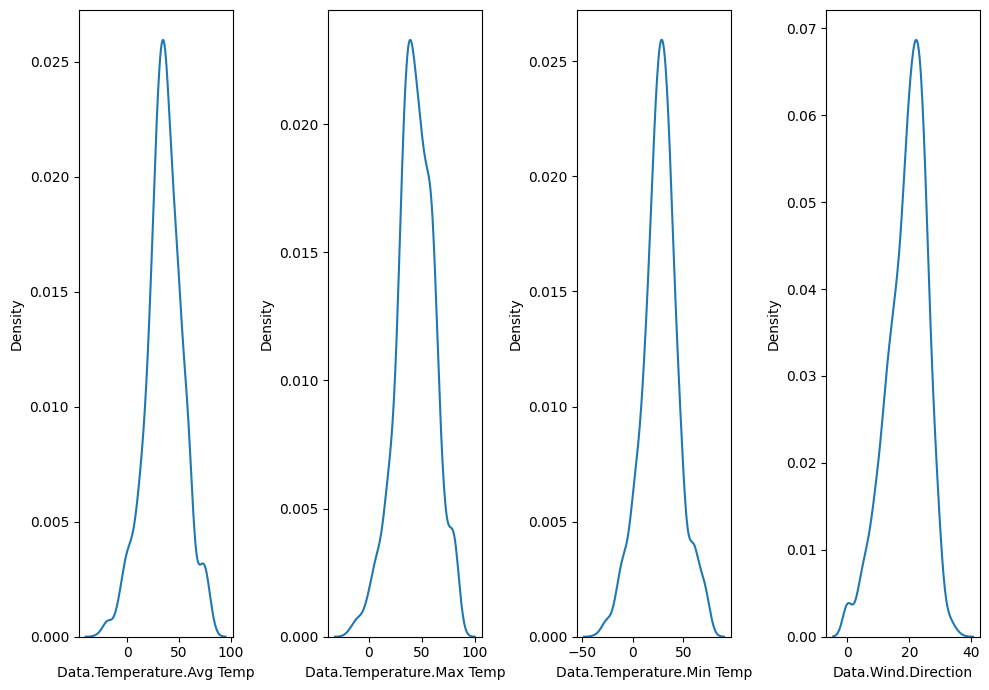

In [28]:
from IPython.display import HTML # Import the HTML function

for k in sorted(weather["Date.Month"].unique()):
    fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(10, 7))
    display(HTML("<h2>Data distribution in {}</h2>".format(weather['Date.Month'][k-1]))) # Assuming you want to use your weather dataframe
    temp_df = weather[weather["Date.Month"] == k]
    for i, j in enumerate(nums):
        # plots(temp_df, "Date.Week of", j, axes[i], True) # Assuming 'plots' and 'bar_label' are custom functions that are defined elsewhere
        # axes[i].set_xticklabels(axes[i].get_xticklabels(), rotation=90)
        # bar_label(axes[i])
        # axes[i].set_ylabel("")
        # axes[i].set_xlabel(' '.join(j.split('_')[:-1]))
        pass # Replace with your plotting logic
    plt.tight_layout()
    plt.show()

    fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(10, 7))
    for i, j in enumerate(nums):
        sns.kdeplot(temp_df, x=j, ax=axes[i])

    plt.tight_layout()
    plt.show()

Places with highest and lowest average temperature:

In [29]:
def bar_label(ax):
    """Add labels to the bars in a bar plot."""
    for p in ax.patches:
        height = p.get_height()
        ax.text(p.get_x() + p.get_width() / 2., height + 0.1,
                '{:.2f}'.format(height), ha="center")

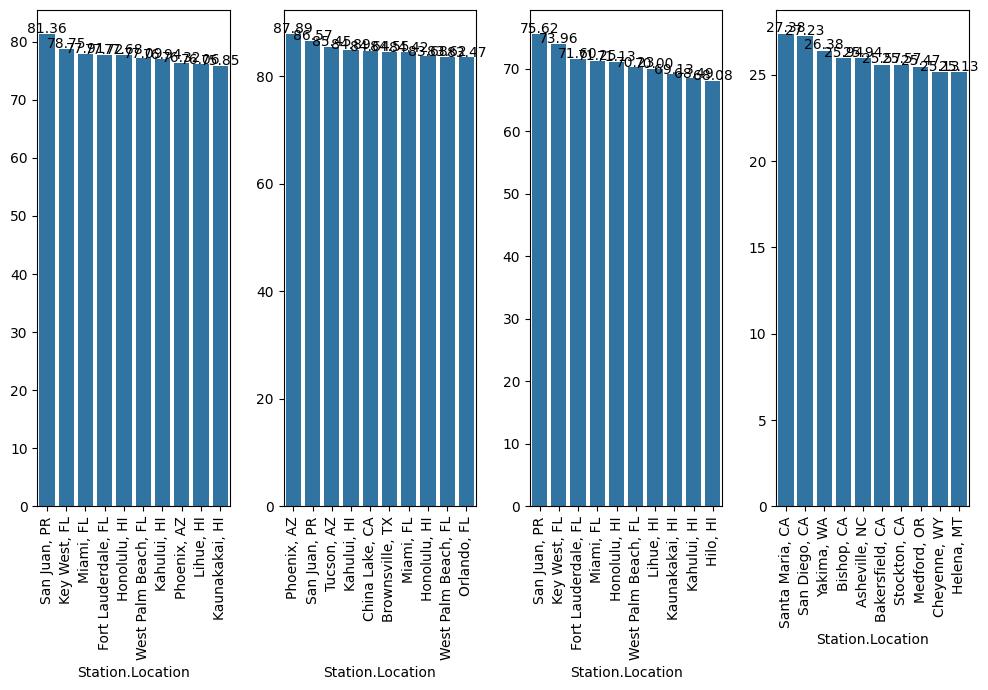

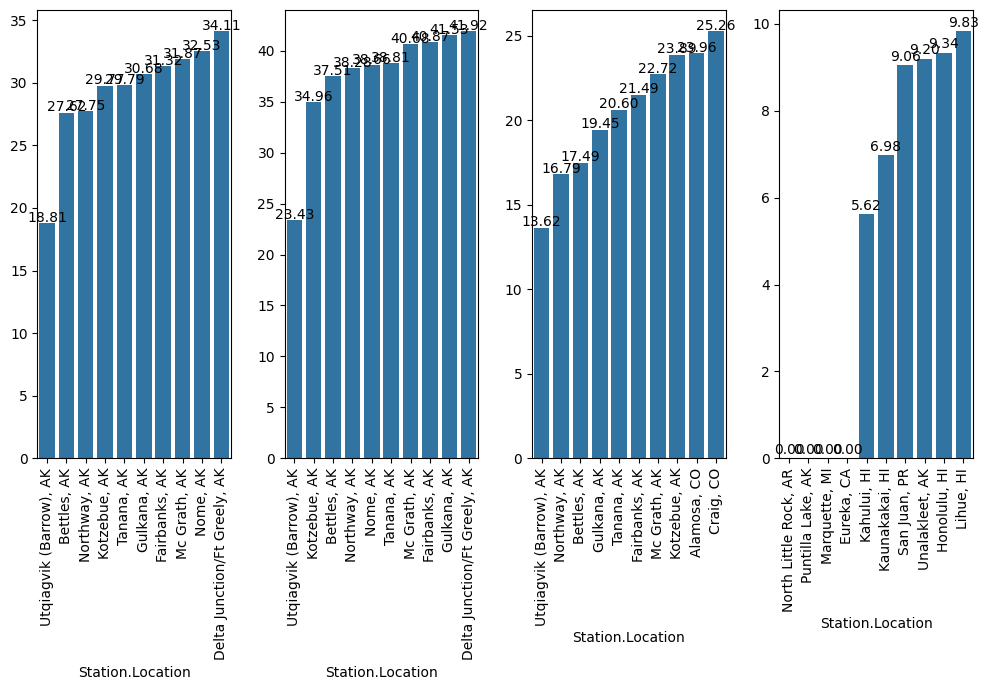

In [30]:
from IPython.display import HTML
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

def bar_label(ax):
    """Add labels to the bars in a bar plot."""
    for p in ax.patches:
        height = p.get_height()
        ax.text(p.get_x() + p.get_width() / 2., height + 0.1,
                '{:.2f}'.format(height), ha="center")

display(HTML("<h2>Top 10 from top to bottom</h2>"))
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(10, 7))
grouped = weather.groupby("Station.Location")
for i, j in enumerate(nums):
    mean = grouped[j].mean()
    mean = pd.DataFrame(mean)
    mean = mean.sort_values(j, ascending=False)
    sns.barplot(x=mean.index[:10], y=mean.iloc[:10, 0], ax=axes[i])
    bar_label(axes[i])  # Call the defined bar_label function
    axes[i].set_xticklabels(axes[i].get_xticklabels(), rotation=90)
    axes[i].set_ylabel(' '.join(j.split('_')[:-1]))
plt.tight_layout()
plt.show()

display(HTML("<h2>Top 10 from bottom to top</h2>"))
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(10, 7))
for i, j in enumerate(nums):
    mean = grouped[j].mean()
    mean = pd.DataFrame(mean)
    mean = mean.sort_values(j, ascending=True)
    sns.barplot(x=mean.index[:10], y=mean.iloc[:10, 0], ax=axes[i])
    bar_label(axes[i])  # Call the defined bar_label function
    axes[i].set_xticklabels(axes[i].get_xticklabels(), rotation=90)
    axes[i].set_ylabel(' '.join(j.split('_')[:-1]))
plt.tight_layout()
plt.show()

Cities with highest and lowest Average temperature:

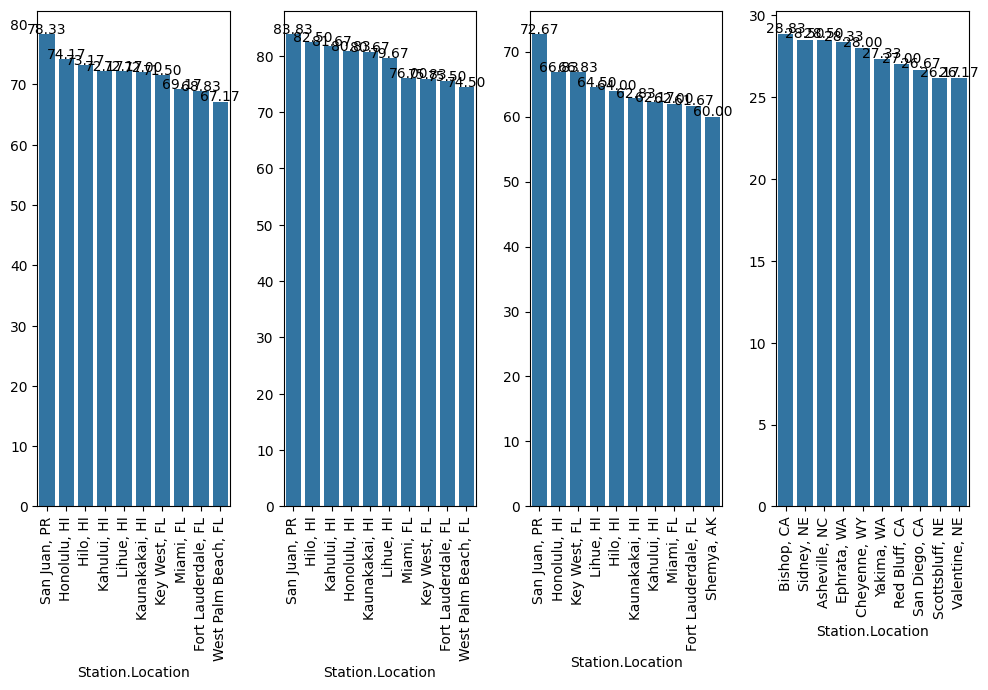

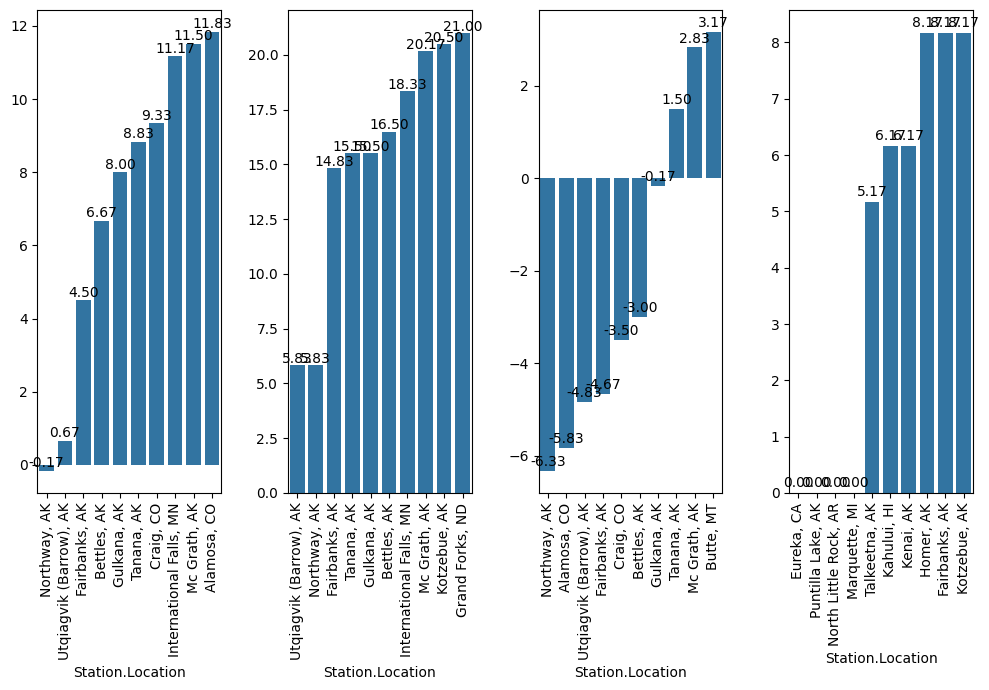

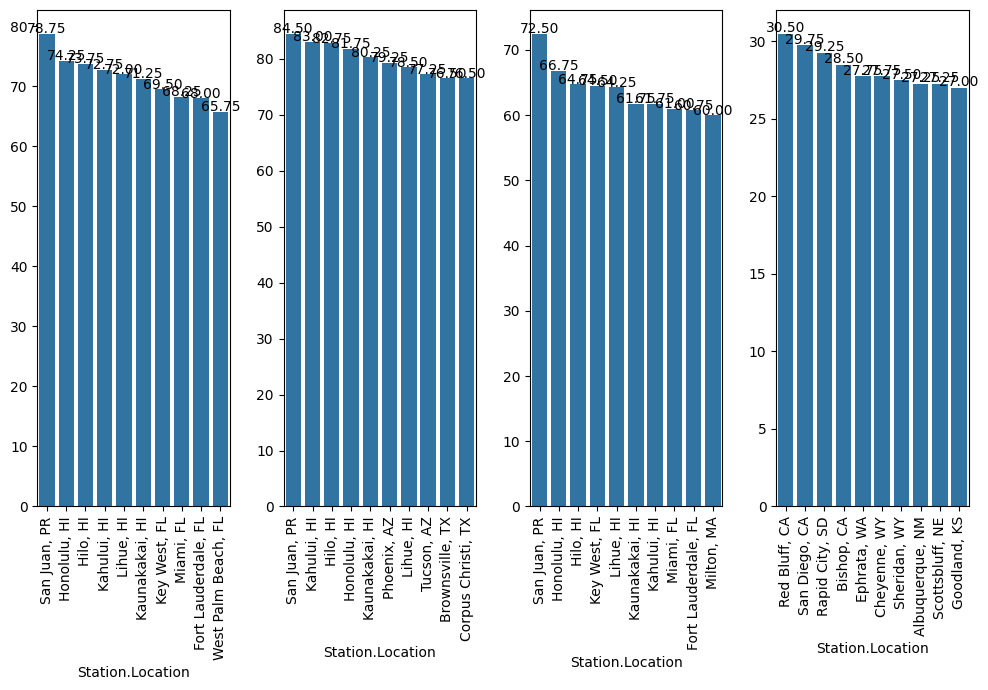

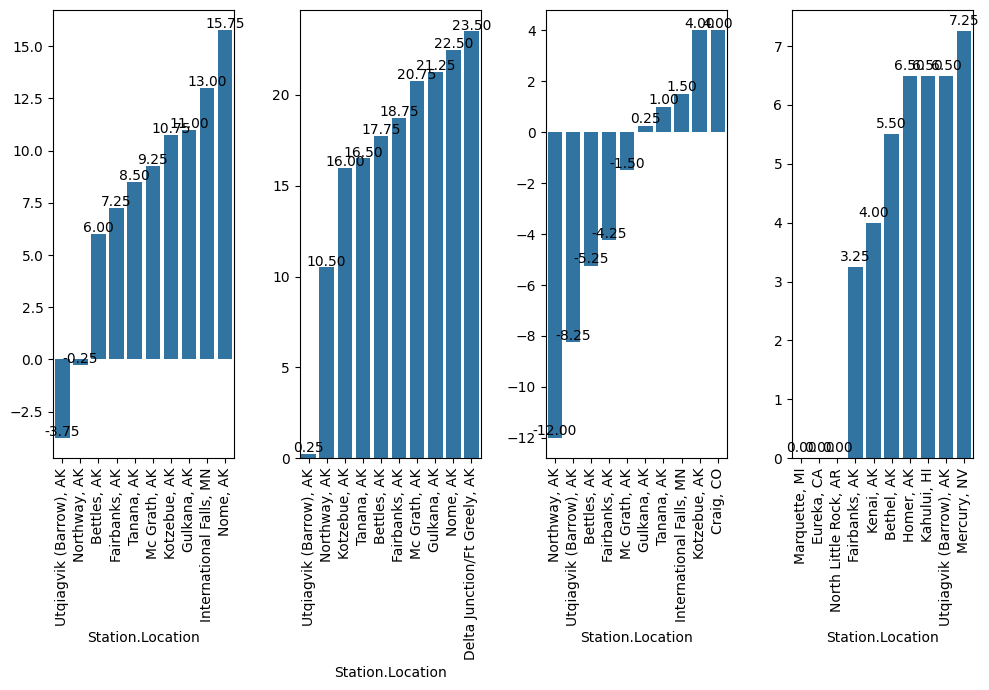

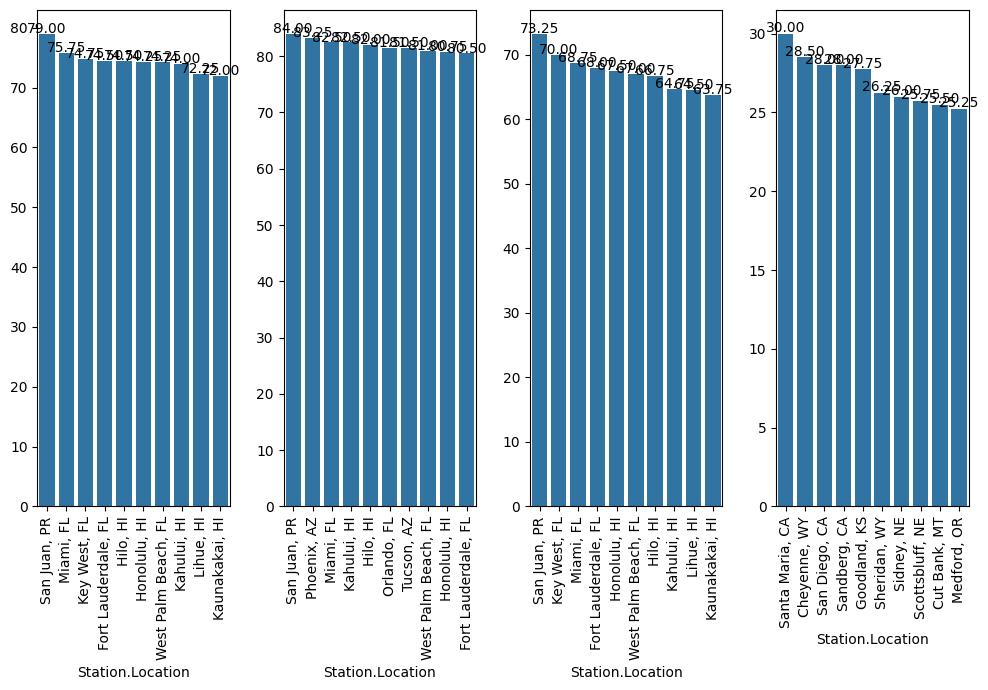

...

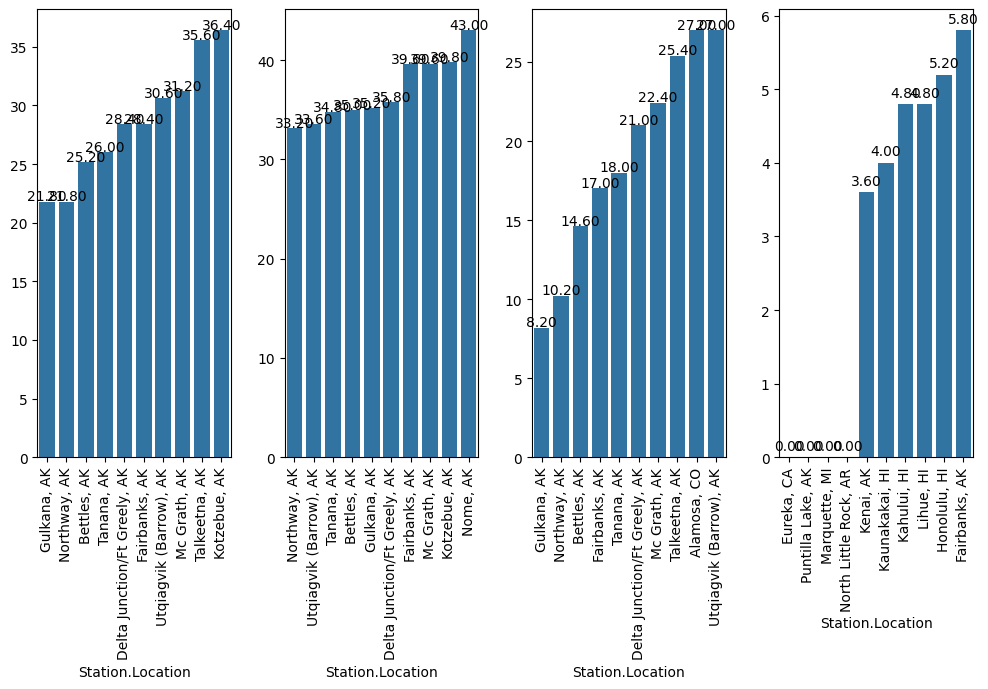

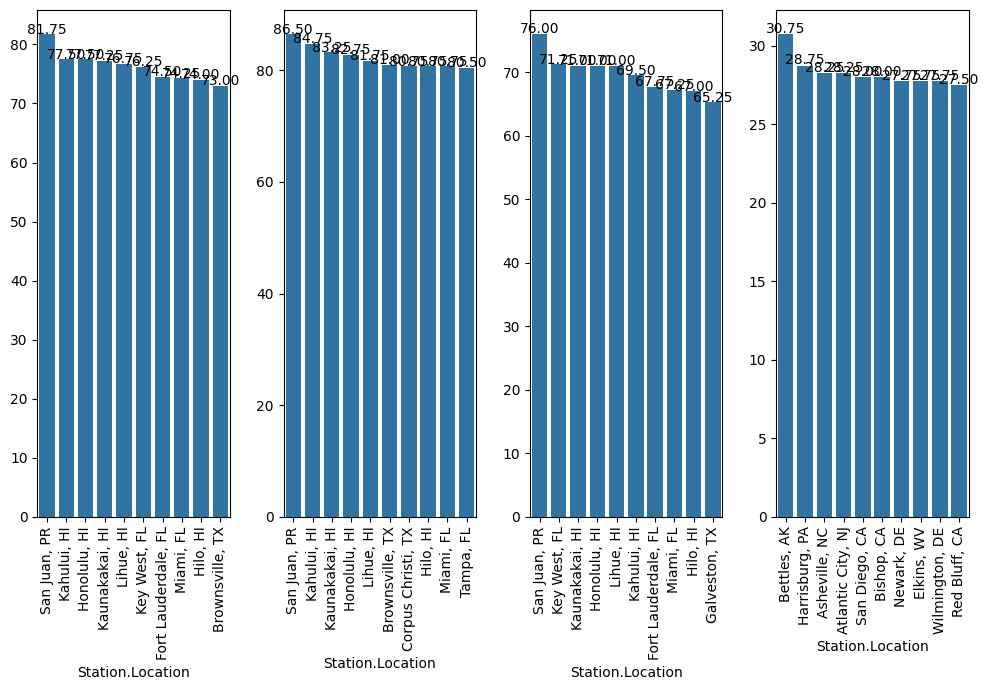

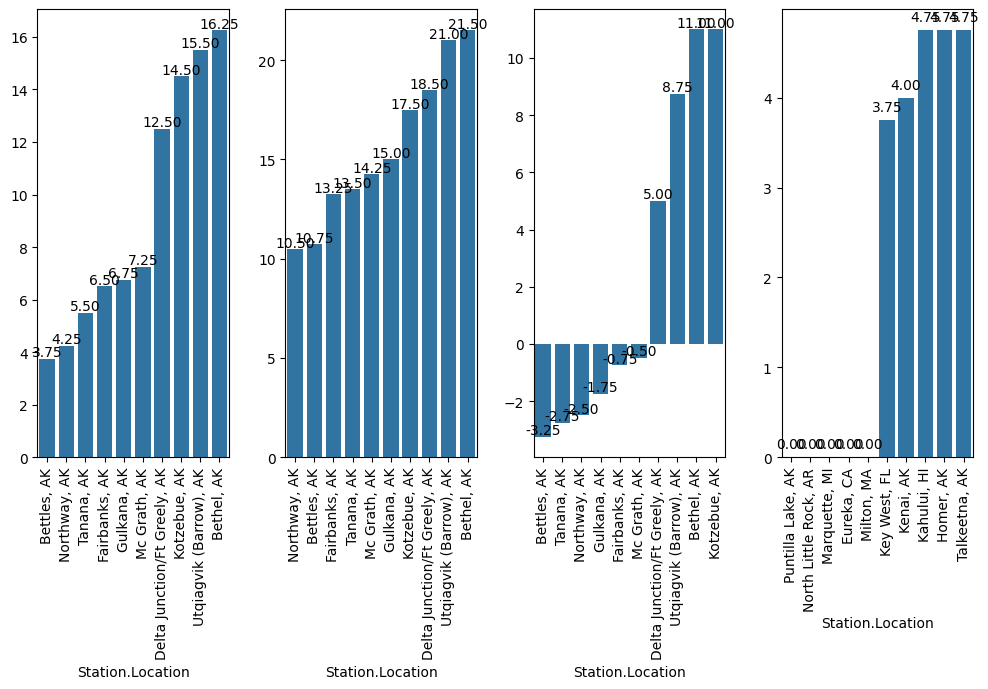

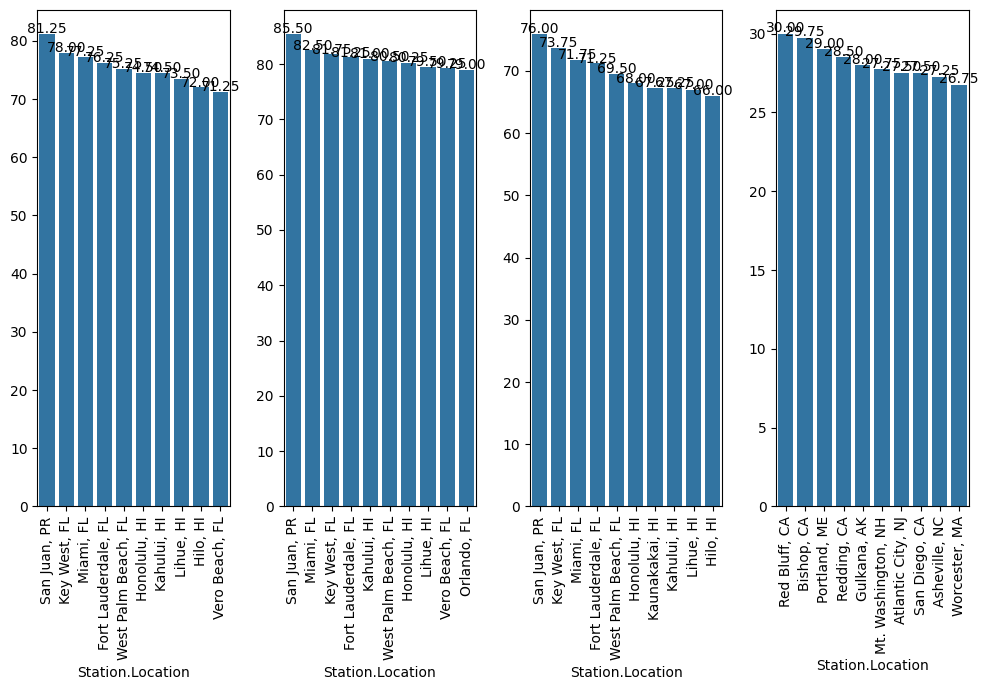

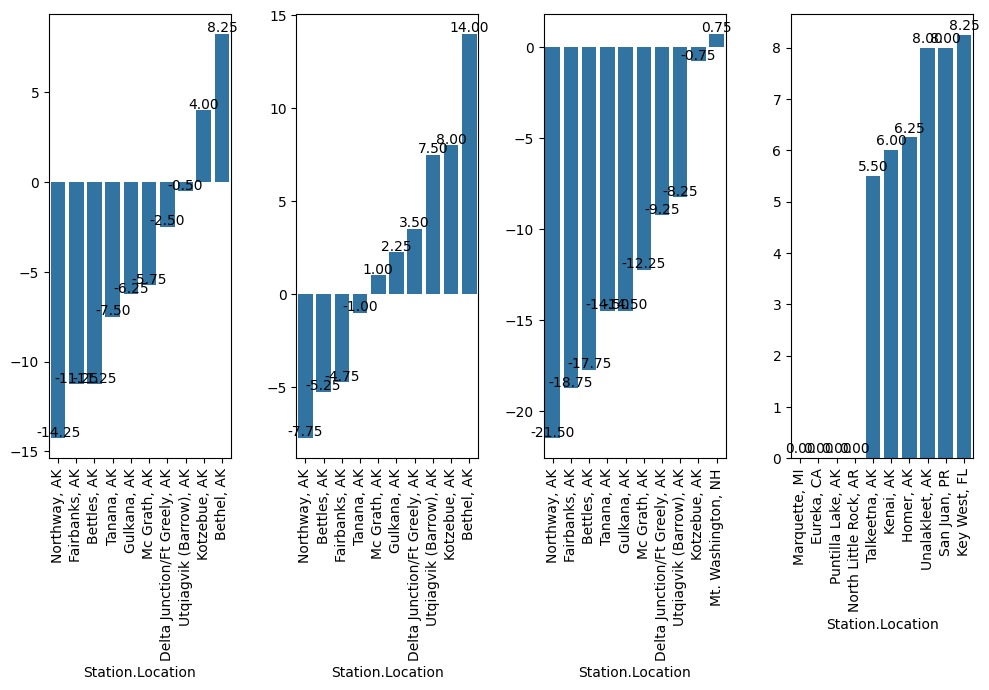

In [34]:
for k in sorted(weather["Date.Month"].unique()):
    temp_df = weather[weather["Date.Month"] == k]
    # Access the 'Date.Month' column directly from the 'weather' DataFrame
    display(HTML("<h2>Measures in cities for {}</h2>".format(weather['Date.Month'][k-1])))
    display(HTML("<h3>Top 10 from top to bottom</h3>"))
    fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(10, 7))
    grouped = temp_df.groupby("Station.Location")
    for i, j in enumerate(nums):
        mean = grouped[j].mean()
        mean = pd.DataFrame(mean)
        mean = mean.sort_values(j, ascending=False)
        sns.barplot(x=mean.index[:10], y=mean.iloc[:10, 0], ax=axes[i])
        bar_label(axes[i])
        axes[i].set_xticklabels(axes[i].get_xticklabels(), rotation=90)
        axes[i].set_ylabel(' '.join(j.split('_')[:-1]))
    plt.tight_layout()
    plt.show()

    display(HTML("<h3>Top 10 from bottom to top</h3>"))
    fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(10, 7))
    for i, j in enumerate(nums):
        mean = grouped[j].mean()
        mean = pd.DataFrame(mean)
        mean = mean.sort_values(j, ascending=True)
        sns.barplot(x=mean.index[:10], y=mean.iloc[:10, 0], ax=axes[i])
        bar_label(axes[i])
        axes[i].set_xticklabels(axes[i].get_xticklabels(), rotation=90)
        axes[i].set_ylabel(' '.join(j.split('_')[:-1]))
    plt.tight_layout()
    plt.show()

Highest and lowest average temperature every month:

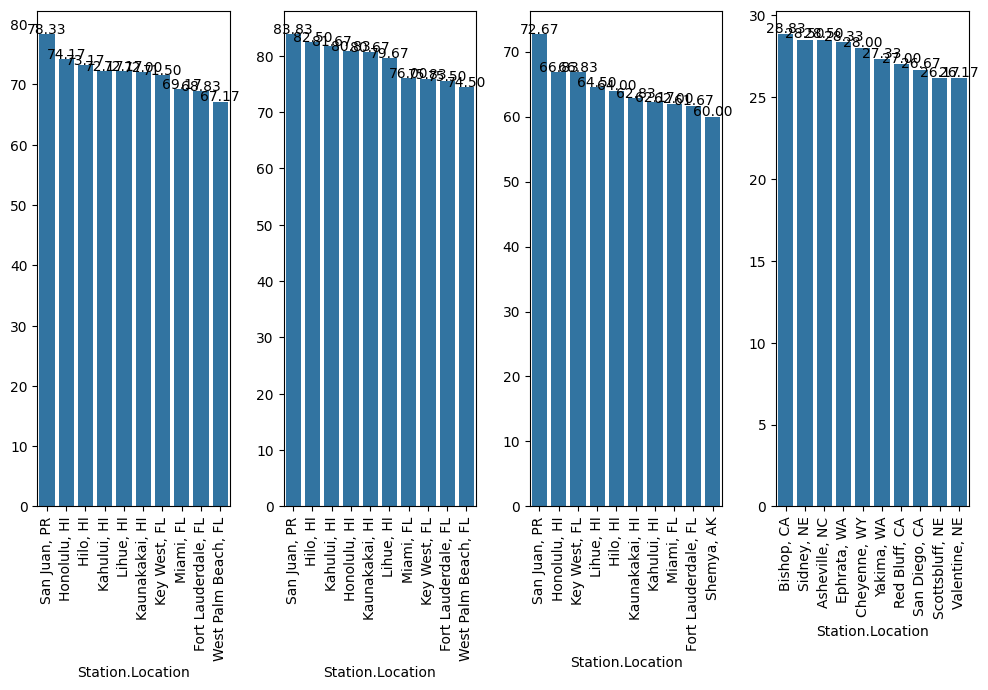

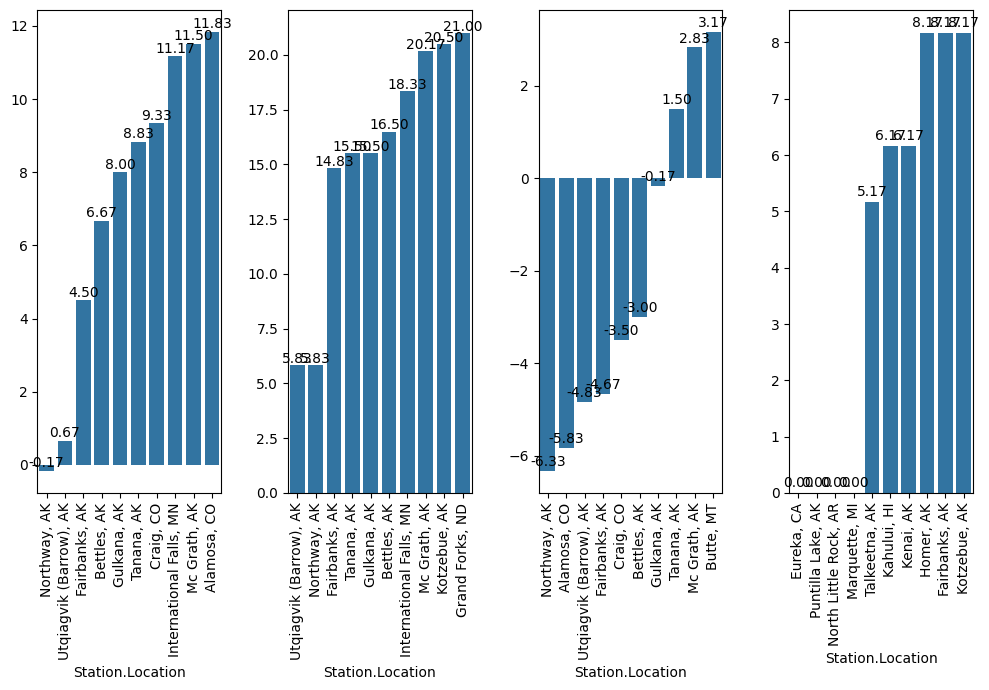

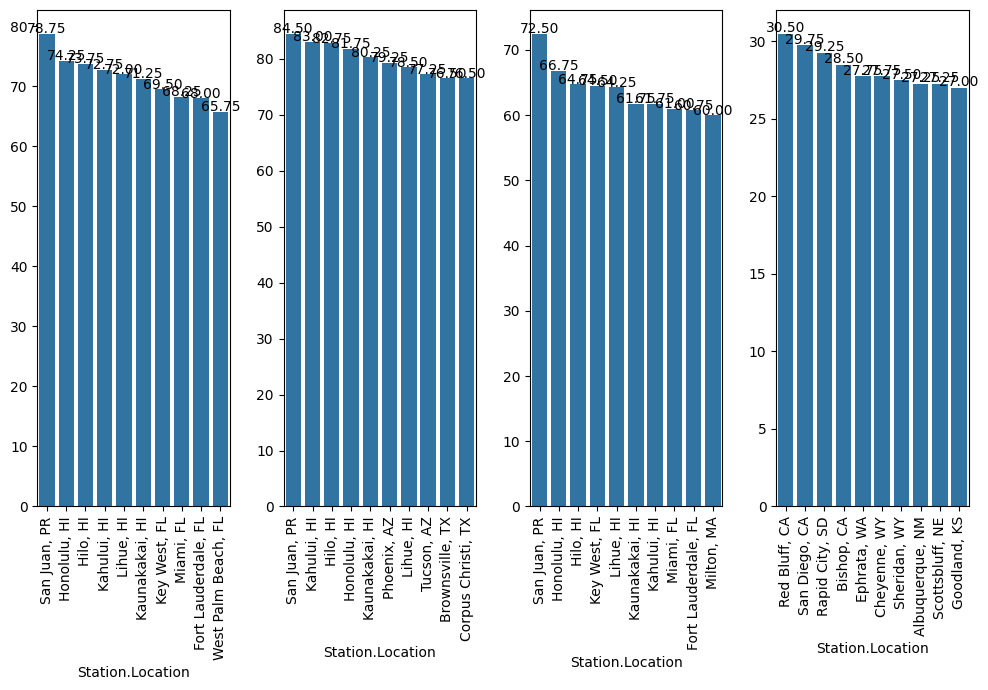

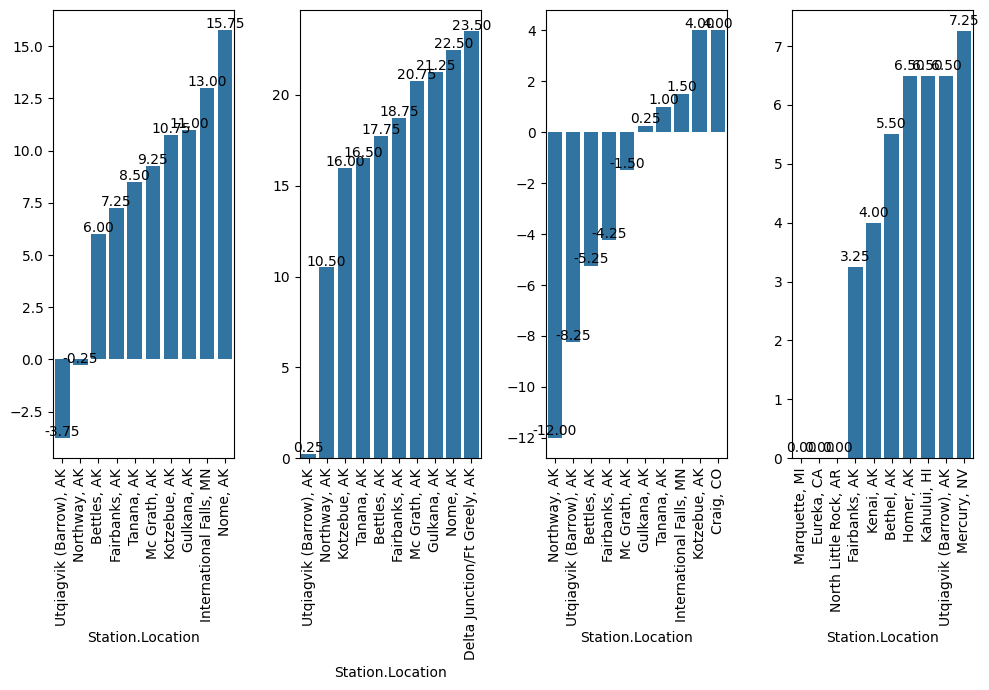

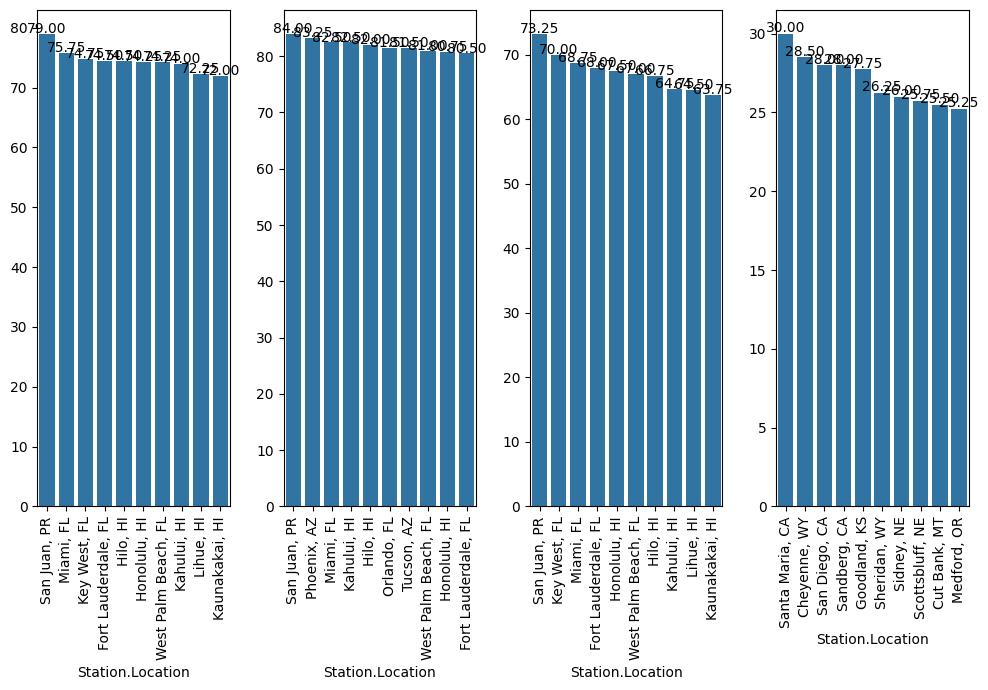

...

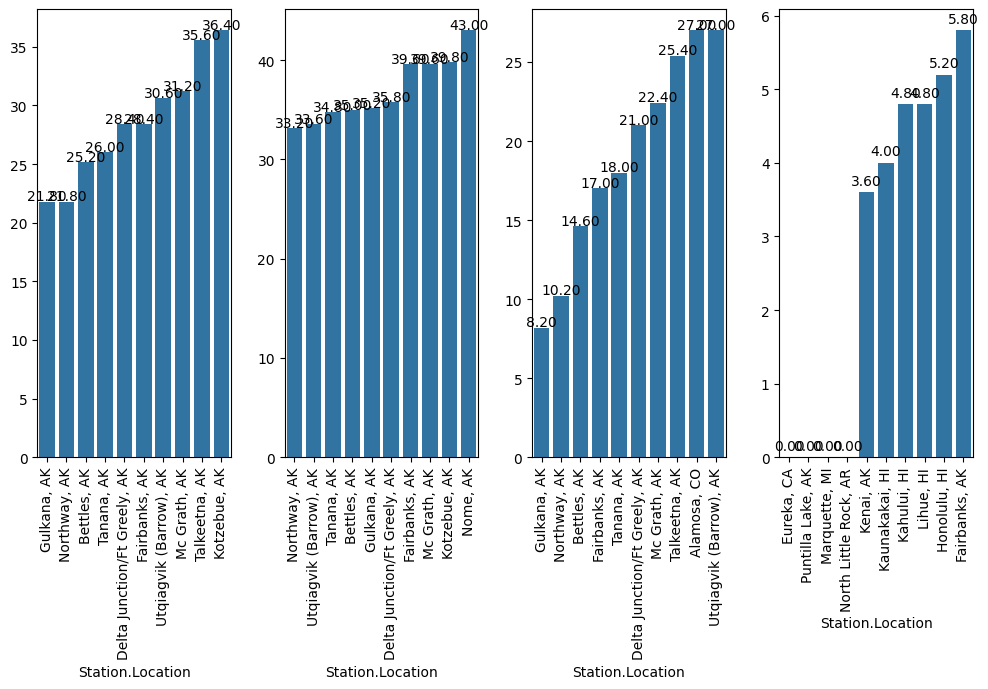

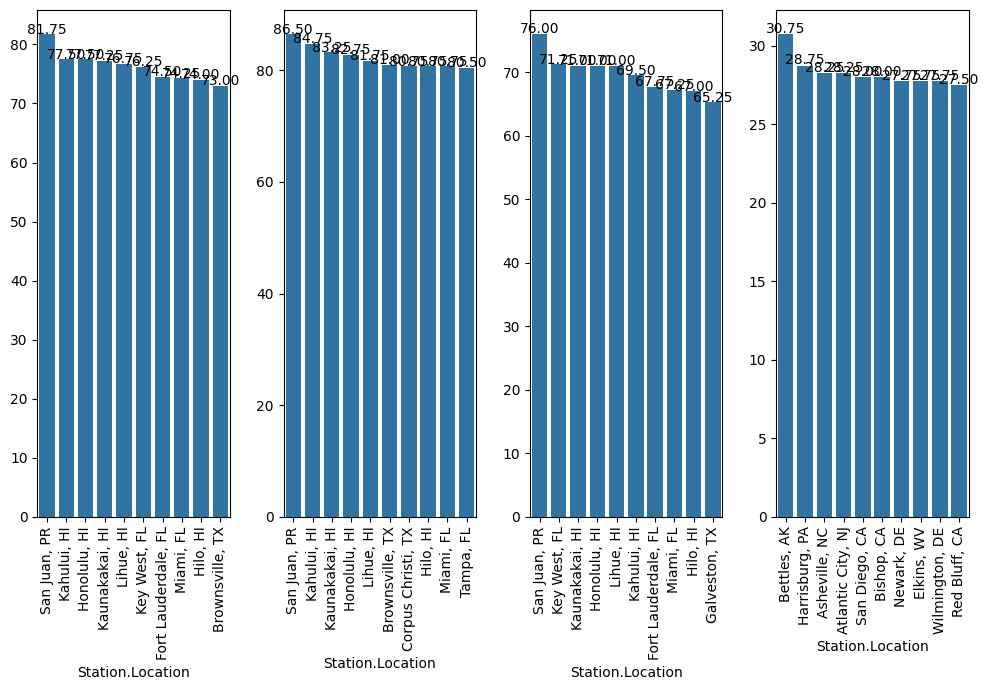

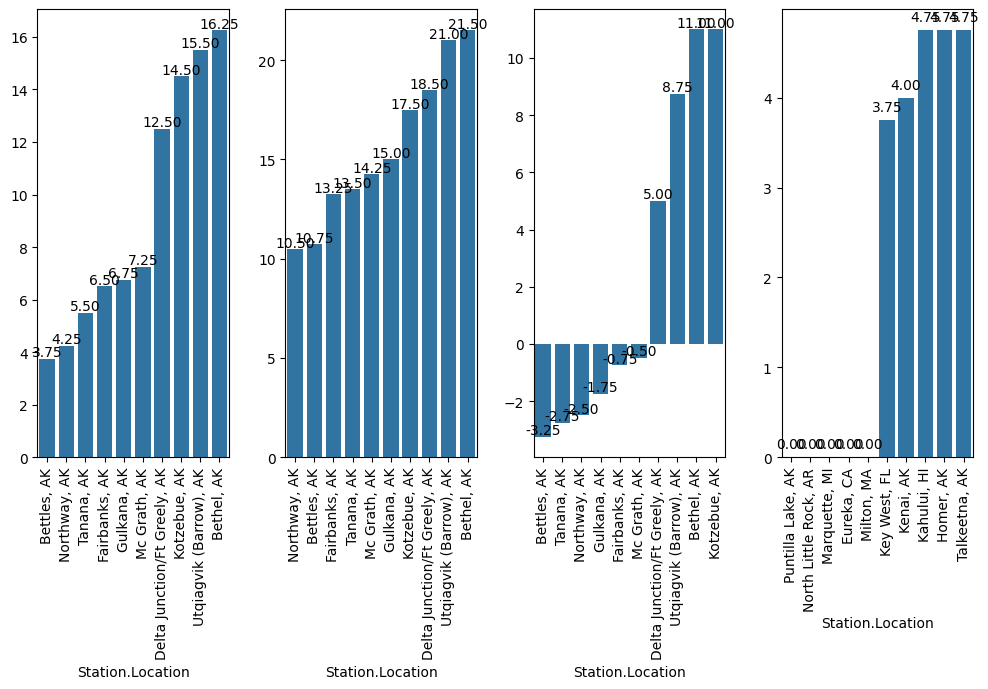

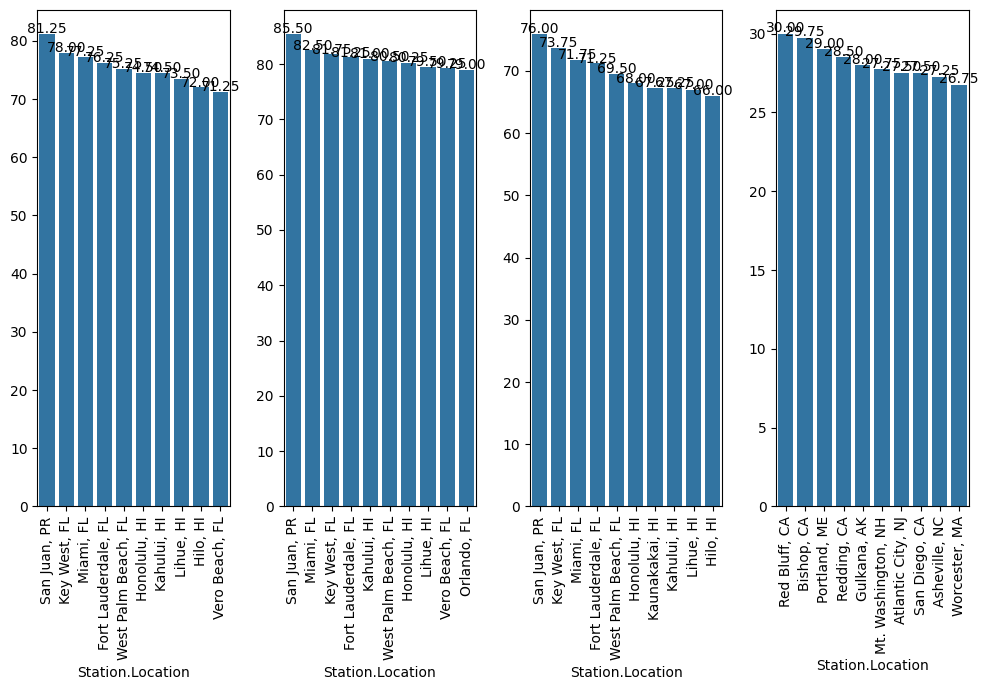

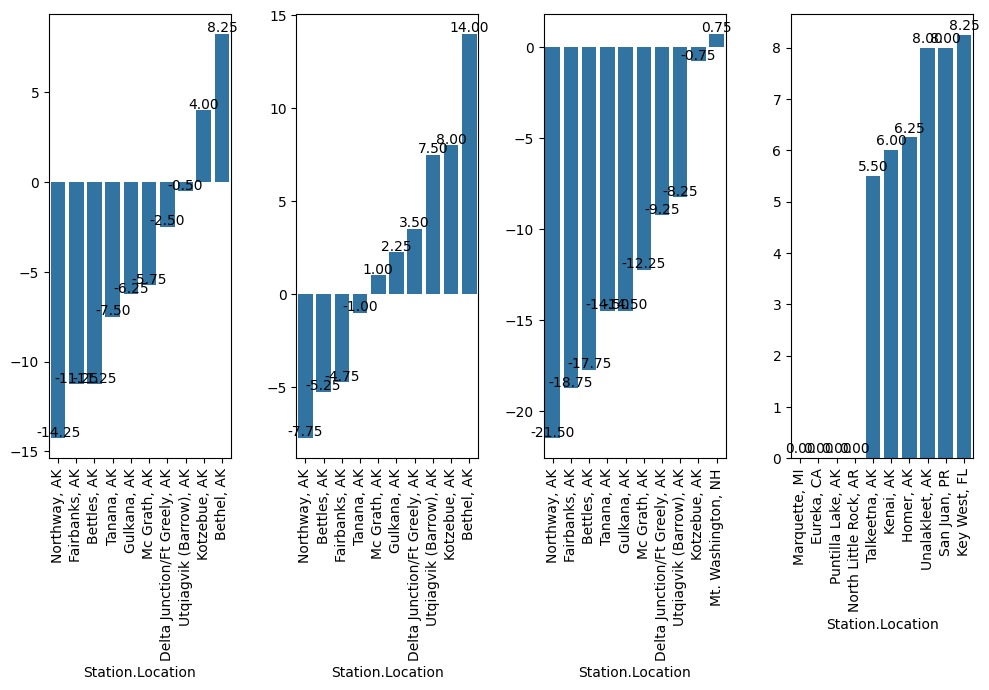

In [37]:
for k in sorted(weather["Date.Month"].unique()):
    temp_df = weather[weather["Date.Month"] == k]
    # Access the 'Date.Month' column directly from the 'weather' DataFrame
    # Changed 'Date.Month' to 'weather['Date.Month']' to access the column
    display(HTML("<h2>Measures in cities for {}</h2>".format(weather['Date.Month'][k-1])))
    display(HTML("<h3>Top 10 from top to bottom</h3>"))
    fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(10, 7))
    grouped = temp_df.groupby("Station.Location")
    for i, j in enumerate(nums):
        mean = grouped[j].mean()
        mean = pd.DataFrame(mean)
        mean = mean.sort_values(j, ascending=False)
        sns.barplot(x=mean.index[:10], y=mean.iloc[:10, 0], ax=axes[i])
        bar_label(axes[i])
        axes[i].set_xticklabels(axes[i].get_xticklabels(), rotation=90)
        axes[i].set_ylabel(' '.join(j.split('_')[:-1]))
    plt.tight_layout()
    plt.show()

    display(HTML("<h3>Top 10 from bottom to top</h3>"))
    fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(10, 7))
    for i, j in enumerate(nums):
        mean = grouped[j].mean()
        mean = pd.DataFrame(mean)
        mean = mean.sort_values(j, ascending=True)
        sns.barplot(x=mean.index[:10], y=mean.iloc[:10, 0], ax=axes[i])
        bar_label(axes[i])
        axes[i].set_xticklabels(axes[i].get_xticklabels(), rotation=90)
        axes[i].set_ylabel(' '.join(j.split('_')[:-1]))
    plt.tight_layout()
    plt.show()

Selecting data for forecasting:

In [40]:
data = weather[nums].copy()

Data Preparation:

In [41]:
cols = data.columns

for i in cols:
    dname = "Target "+i
    data[dname] = data[i].shift(-1)

In [42]:
data.dropna(inplace=True)

Data Scaling:

In [44]:
!pip install scikit-learn # Install scikit-learn if you haven't already
from sklearn.preprocessing import MinMaxScaler # Import the MinMaxScaler class

sc = MinMaxScaler()
scaled = sc.fit_transform(data.values)

In [45]:
x = []

backcandles = 1
for j in range(4):
    x.append([])
    for i in range(backcandles, scaled.shape[0]):
        x[j].append(scaled[i-backcandles:i, j])

x = np.moveaxis(x, [0], [2])

x, yi = np.array(x), np.array(scaled[backcandles:, -4:])
y = np.reshape(yi, (len(yi), 4))

In [46]:
split = int(len(x)*0.8)

x_train, x_test = x[:split], x[split:]
y_train, y_test = y[:split], y[split:]

ANN architecture for forecasting:

In [48]:
!pip install tensorflow # Install TensorFlow if you haven't already
import tensorflow as tf # Import TensorFlow
from tensorflow import keras # Import Keras from TensorFlow

lstm_input = keras.layers.Input(shape=(backcandles, 4), name="lstm_input")
inputs = keras.layers.LSTM(150, name="first_layer")(lstm_input)
inputs = keras.layers.Dense(4, name="dense_layer")(inputs)
model = keras.models.Model(inputs=lstm_input, outputs=inputs)
adam = keras.optimizers.Adam()
model.compile(optimizer=adam, loss="mse")
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ lstm_input (InputLayer)              │ (None, 1, 4)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ first_layer (LSTM)                   │ (None, 150)                 │          93,000 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_layer (Dense)                  │ (None, 4)                   │             604 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 93,604 (365.64 KB)

 Trainable params: 93,604 (365.64 KB)

 Non-trainable params: 0 (0.00 B)

Training Data:

In [49]:
history = model.fit(x=x_train, y=y_train, batch_size=64, epochs=20, validation_split=0.1)

Epoch 1/20
189/189 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step - loss: 0.1390 - val_loss: 0.0143
Epoch 2/20
189/189 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - loss: 0.0137 - val_loss: 0.0134
Epoch 3/20
189/189 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step - loss: 0.0124 - val_loss: 0.0135
Epoch 4/20
189/189 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 0.0125 - val_loss: 0.0131
Epoch 5/20
189/189 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 0.0123 - val_loss: 0.0130
Epoch 6/20
189/189 ━━━━━━━━━━━━━━━━━━━━ 2s 9ms/step - loss: 0.0123 - val_loss: 0.0135
Epoch 7/20
189/189 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - loss: 0.0123 - val_loss: 0.0137
Epoch 8/20
189/189 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - loss: 0.0121 - val_loss: 0.0133
Epoch 9/20
189/189 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.0119 - val_loss: 0.0133
Epoch 10/20
189/189 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.0123 - val_loss: 0.0136
Epoch 11/20
189/189 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step - loss: 0.0123 - val_loss: 0.0130
Epoch 12/20
189/189 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/st

Log Performance:

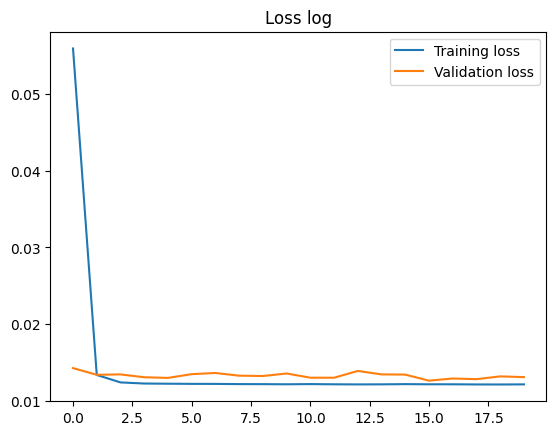

In [50]:
plt.plot(history.history["loss"], label="Training loss")
plt.plot(history.history["val_loss"], label="Validation loss")
plt.legend()
plt.title("Loss log")
plt.show()

Interpreting the plot:
* Observe the trend of both lines. Both training and validation loss are decreasing, then the model is learning well and generalizing well.

* If training loss is decreasing but validation loss is increasing or plateauing, then the model is overfitting. In this case, you might want to adjust your model architecture, add regularization, or increase the amount of data to prevent overfitting.

* If both training and validation loss
are high and not decreasing much, then the model might be underfitting. In this case, you may need to increase the complexity of the model or train for more epochs.

Test data for prediction:

In [51]:
y_pred = model.predict(x_test)

105/105 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step


Evaluation Metrics:

In [53]:
from sklearn.metrics import mean_squared_error, r2_score # Import the necessary functions

y_pred = model.predict(x_test)

mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print("MSE: ", mse)
print("r2: ", r2)

105/105 ━━━━━━━━━━━━━━━━━━━━ 1s 4ms/step
MSE:  0.015211510008193842
r2:  0.35279041983627235


Observation:


*   The model is moderate fit.
*   The prediction of the model may have a degree of error.
*   Since the MSE is 0.015 which means that it is an average model.

